In [1]:
# In this notebook we cover the following
# A. Corner Detection using HARRIS and SHITOMASI
# B. Feature Extraction using SIFT and ORB 
# C. Feature Matching using BRUTE FORCE and FLANN
# D. Homography
# E. Image Stitching
# F. Teamplate Matching
# G. Video Simple Feature Tracking

#!pip uninstall -y opencv-contrib-python
#!pip install opencv-python

import cv2
import matplotlib.pyplot as plt
import numpy as np
from IPython.display import Video

print(cv2.__version__)

def show(image, imgtxt = "Image"):
    plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    plt.title(imgtxt)
    plt.show()

4.8.0


In [2]:
# Define Functions
# Corner Detection
def detect_corners(img, method="HARRIS"):
    himg = img.copy()
    gray_img = np.float32(cv2.cvtColor(img, cv2.COLOR_BGR2GRAY))     
    # Harris corner detector
    if method == "HARRIS":
        corners = cv2.cornerHarris(gray_img, blockSize=2, ksize=3, k=0.04)
        corners = cv2.dilate(corners, None)
        corners = np.intp(corners)
        himg[corners > 0.01 * corners.max()]=[0, 0, 255] 
    # Shi-Tomasi corner detector
    elif method == "SHITOMASI":
        corners = cv2.goodFeaturesToTrack(gray_img, maxCorners=30, qualityLevel=0.01, minDistance=10)#.reshape((-1, 2))
        corners = np.intp(corners)
        for i in corners:
            x,y = i.ravel()
            cv2.circle(himg,(x,y),3,(0,0,255),-1)
    plt.imshow(himg)
    plt.show()    
    return corners

In [3]:
# Feature descriptors

def extract_descriptors(img, corners=None, descriptor="SIFT"):
    fdimg=img.copy()    
    gray_img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)     

    # SIFT
    if descriptor == "SIFT":
        sift = cv2.SIFT_create()
        kp, des = sift.detectAndCompute(gray_img, None)
    # SURF
    elif descriptor == "SURF":
        surf = cv2.xfeatures2d.SURF_create(400)
        # This is just for the demo
        surf.setHessianThreshold(50000)
        surf.setExtended(True)
        surf.setUpright(True)
        kp, des = surf.detectAndCompute(fdimg,None)
    # ORB
    elif descriptor == "ORB":
        orb = cv2.ORB_create()
        kp, des = orb.detectAndCompute(fdimg,((3,3)))
    cv2.drawKeypoints(fdimg,kp,fdimg, color=(255,0,0), flags=cv2.DRAW_MATCHES_FLAGS_NOT_DRAW_SINGLE_POINTS )
    plt.imshow(fdimg)
    plt.show()                           
    return kp, des

In [4]:
# Feature Matching
def match_features(des1,img1,kp1,des2,img2,kp2,method="BRUTE_FORCE"):
    MATCHES_TO_SHOW = 50
    mfimg1 = img1.copy()
    mfimg2 = img2.copy()
    if method == "BRUTE_FORCE":
        bf = cv2.BFMatcher(cv2.NORM_L2, crossCheck=True)
        matches = bf.match(des1, des2)
        matches = sorted(matches, key = lambda x:x.distance)
        img = cv2.drawMatches(mfimg1,kp1,mfimg2,kp2,matches[:50],None,flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)
    elif method == "FLANN":
        FLANN_INDEX_KDTREE = 0
        index_params = dict(algorithm = FLANN_INDEX_KDTREE, trees = 5)
        search_params = dict(checks = 50)
        fl = cv2.FlannBasedMatcher(index_params,search_params)
        
        matches = fl.knnMatch(des1, des2, k=2)
        
        # Need to draw only good matches, so create a mask
        matchesMask = [[0,0] for i in range(len(matches))]

        # ratio test as per Lowe's paper
        for i,(m,n) in enumerate(matches):
           if m.distance < 0.7*n.distance:
              matchesMask[i]=[1,0]
        draw_params = dict(matchColor = (0,255,0),singlePointColor = (0,255,0),matchesMask = matchesMask,flags = cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)
        img = cv2.drawMatchesKnn(mfimg1,kp1,mfimg2,kp2,matches,None,**draw_params)
    plt.imshow(img),
    plt.show()
    return matches

In [5]:
# Homography estimation
def estimate_homography(keypoints1,keypoints2,matched_keypoints):
    src_pts = np.float32([keypoints1[keypoint.queryIdx].pt for keypoint in matched_keypoints]).reshape(-1, 1, 2)
    dst_pts = np.float32([keypoints2[keypoint.trainIdx].pt for keypoint in matched_keypoints]).reshape(-1, 1, 2)
    M, mask = cv2.findHomography(src_pts, dst_pts, cv2.RANSAC, 5.0)
    return M,mask

In [6]:
# image stitching
def stitch_images(img1, img2, M):
    h1, w1, _ = img1.shape
    h2, w2, _ = img2.shape
    pts = np.float32([[0, 0], [0, h2], [w2, h2], [w2, 0]]).reshape(-1, 1, 2)
    dst = cv2.perspectiveTransform(pts, M)
    h_panorama = max(h1, h2 + dst[2, 0, 1])
    w_panorama = w1 + w2
    panorama = np.zeros((h_panorama, w_panorama, 3), np.uint8)
    panorama[0:h1, 0:w1] = img1
    panorama[0:h2, w1:w_panorama] = img2
    return panorama

In [7]:
# Tenplate Mathing
def template_matching(template_image_path, larger_image_path):

  # Read images
  template = cv2.imread(template_image_path)
  img = cv2.imread(larger_image_path)

  # Template matching
  res = cv2.matchTemplate(img, template, cv2.TM_SQDIFF)
  min_val, max_val, min_loc, max_loc = cv2.minMaxLoc(res)
  top_left = min_loc

  # Draw bounding box around the match
  bottom_right = (top_left[0] + template.shape[1], top_left[1] + template.shape[0])
  cv2.rectangle(img, top_left, bottom_right, (0, 255, 0), 2)

  return img, top_left

In [8]:
# Feature Tracking
def feature_tracking(video_path):
  # Read video
  cap = cv2.VideoCapture(video_path)
    
  # Get video metadata
  video_fps = cap.get(cv2.CAP_PROP_FPS),
  height = cap.get(cv2.CAP_PROP_FRAME_HEIGHT)
  width = cap.get(cv2.CAP_PROP_FRAME_WIDTH)
  fourcc = cv2.VideoWriter_fourcc(*"MJPG")
  out = cv2.VideoWriter('output.avi',  fourcc=fourcc,
                     fps=video_fps[0], frameSize=(int(width), int(height)), isColor=True)
    
  # Read first frame and detect features
  feature_tracker = cv2.TrackerMIL_create()
  bbox = (100,100,500, 500)
  while True:
    ret, frame = cap.read()
    gray_frame = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)
    if np.sum(gray_frame) > 0: 
        break
  features = cv2.goodFeaturesToTrack(gray_frame, 25, 0.01, 10)
  feature_tracker.init(gray_frame, bbox)
  out.write(frame)
  
  # Track features in subsequent frames
  while True:
    ret, frame = cap.read()
    if not ret:
      break
    # Track features
    gray_frame = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)
    ret, next_features = feature_tracker.update(gray_frame)
    if ret:
        # Draw tracks
        for i, (new, old) in enumerate(zip(next_features, features)):
            try:   
              a, b = new.ravel()
              c, d = old.ravel()
              #(a, b, c, d) = [int(v) for v in (new, old)]

              cv2.line(frame, (a, b), (c, d), (255, 0, 0), 2)
              cv2.circle(frame, (a, b), 3, (0, 255, 0), -1)
            except:
               1==2 
        out.write(frame)
    features = next_features
  cap.release()
  out.release()
  cv2.destroyAllWindows()
  return out


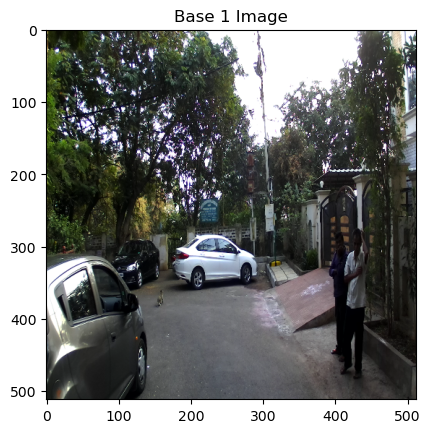

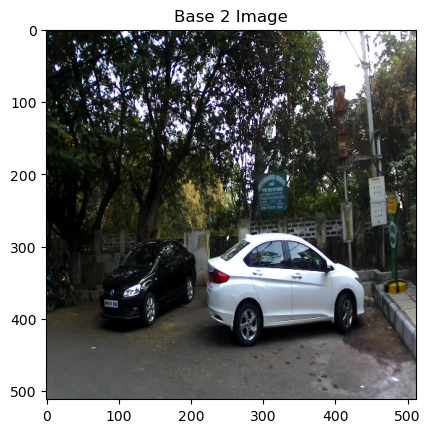

In [9]:
###############################
# Notebook examples start here
# Load Base images
###############################

img1 = cv2.imread("./images/Image_2315.png")
img2 = cv2.imread("./images/Image_2307.png")
show(img1, "Base 1 Image")
show(img2, "Base 2 Image")

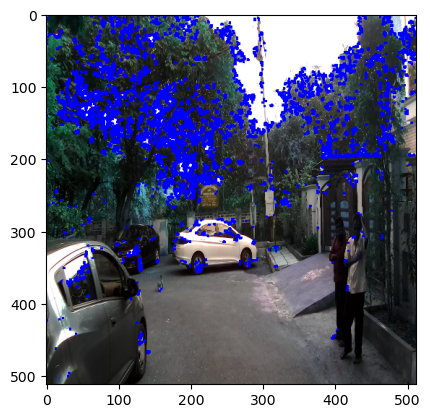

In [10]:
# A. Corber detection
#HARRIS
corners1 = detect_corners(img1)

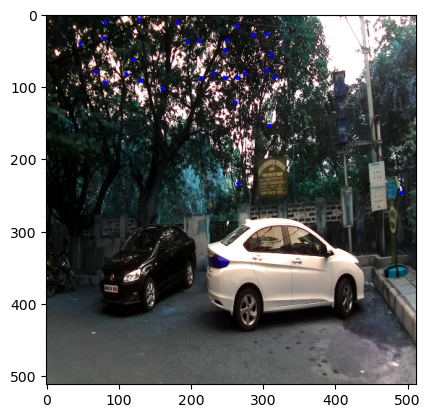

In [11]:
# SHITOMASI
corners2 = detect_corners(img2,method="SHITOMASI")

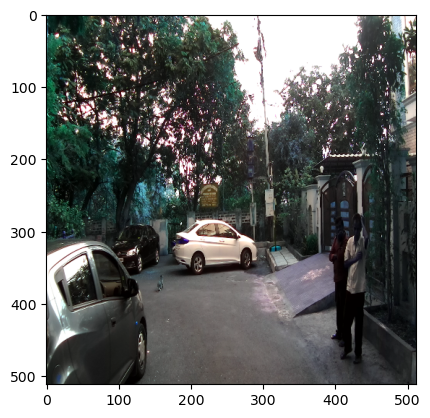

In [12]:
# B. Feacture Extraction
# ORB
keypoints1,descriptors1 = extract_descriptors(img1,corners1,descriptor="ORB")

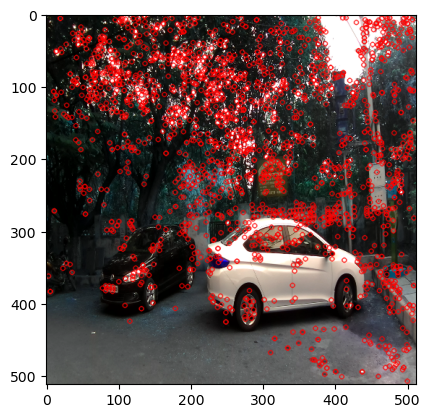

In [13]:
# Extract descriptors : SIFT
keypoints2,descriptors2 = extract_descriptors(img2)

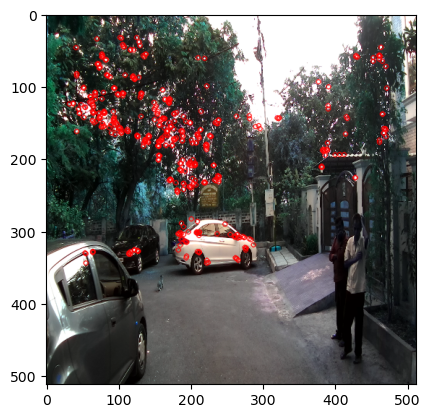

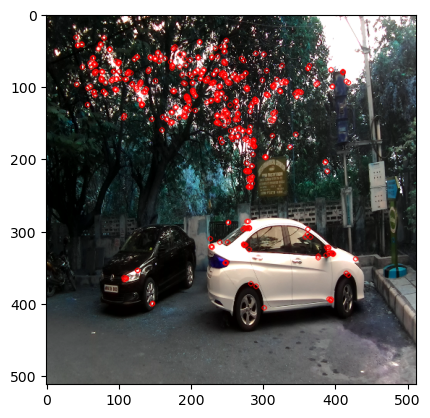

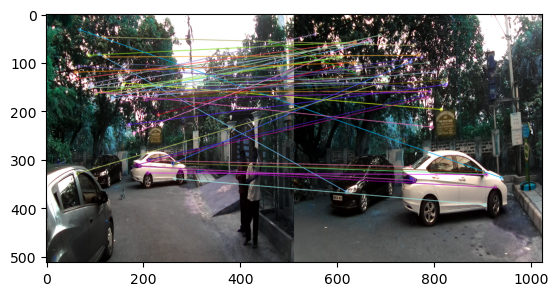

In [14]:
# C. Feature Matching : Involves extracting dewscriptors and matching
# Brute Force 
keypoints1,descriptors1 = extract_descriptors(img1,corners1,descriptor="ORB")
keypoints2,descriptors2 = extract_descriptors(img2,corners2,descriptor="ORB")
matches  = match_features(descriptors1,img1,keypoints1,descriptors2,img2,keypoints2)

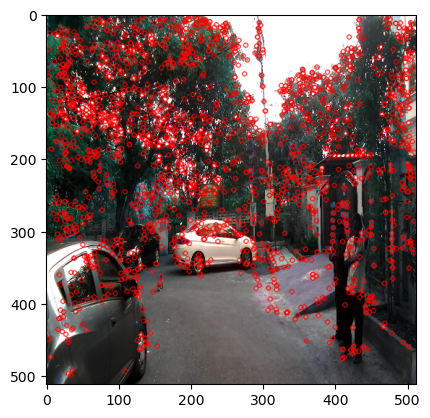

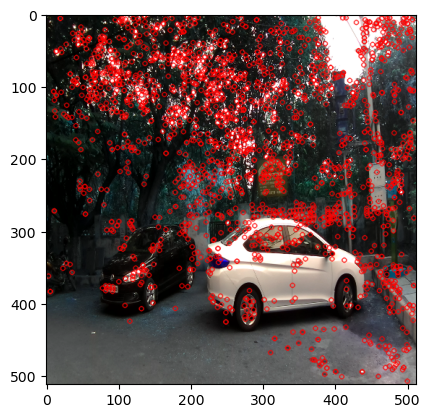

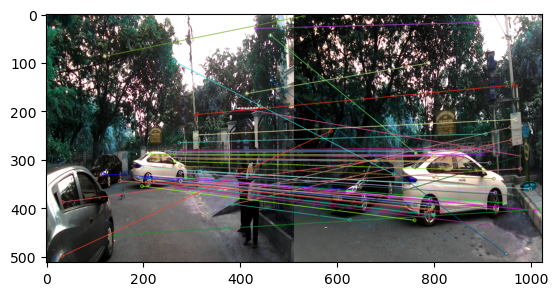

In [15]:
# C. Feature Matching : Involves extracting dewscriptors and matching
# Brute Force 
keypoints1,descriptors1 = extract_descriptors(img1)
keypoints2,descriptors2 = extract_descriptors(img2)
matches  = match_features(descriptors1,img1,keypoints1,descriptors2,img2,keypoints2)

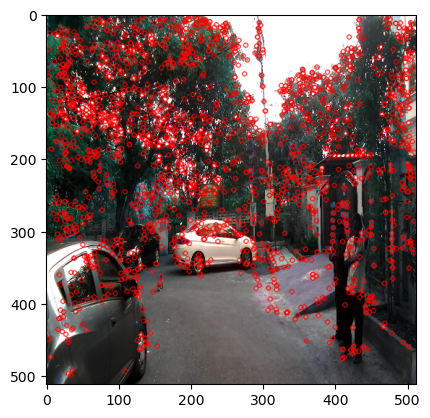

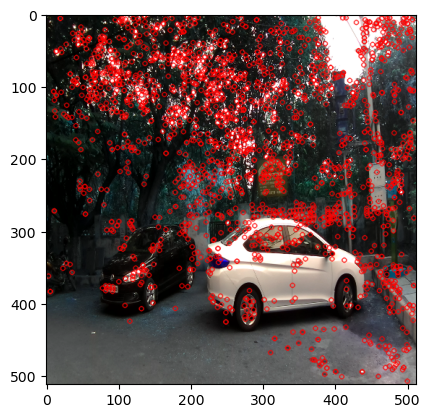

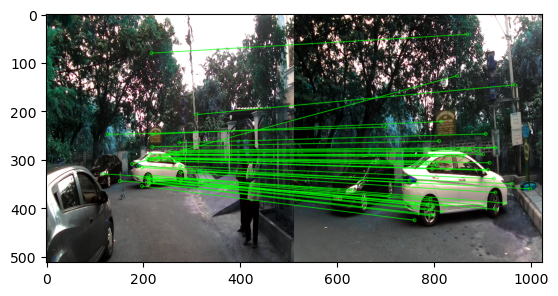

In [16]:
# Flann
keypoints1,descriptors1 = extract_descriptors(img1)
keypoints2,descriptors2 = extract_descriptors(img2)
matches = match_features(descriptors1,img1,keypoints1,descriptors2,img2,keypoints2,method="FLANN")

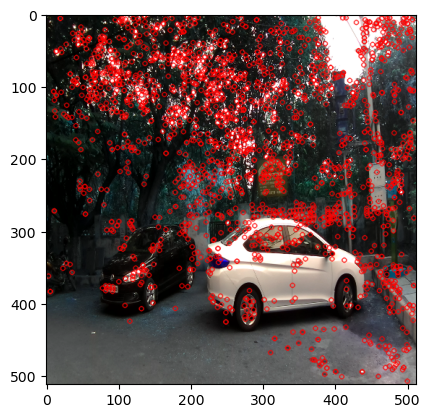

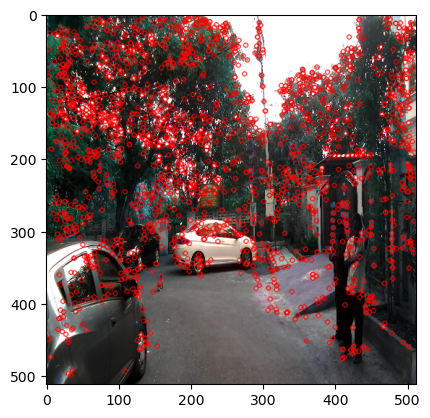

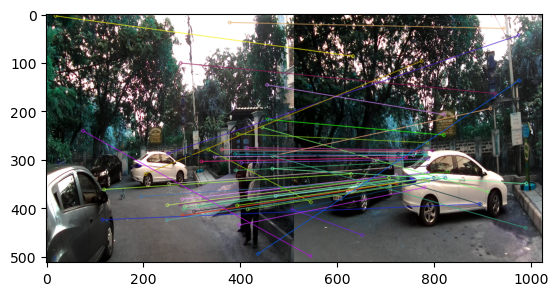

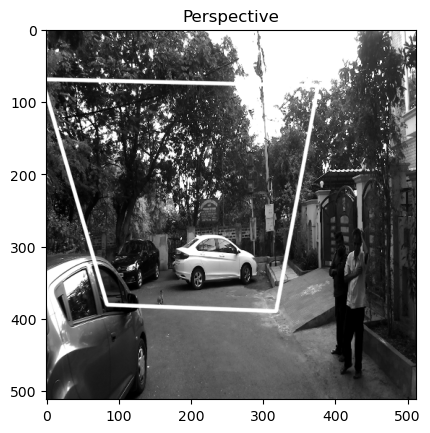

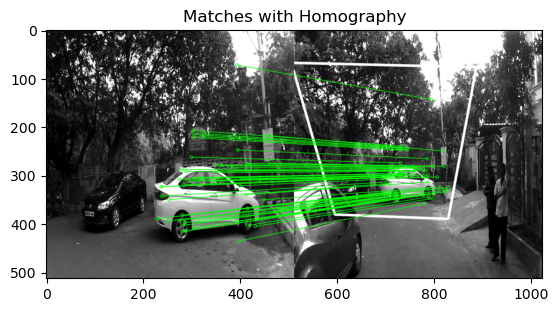

In [17]:
# D. Estimate Homography
# Estimate homography
MIN_MATCH_COUNT = 10
img1 = cv2.imread('./images/Image_2307.png')         
img2 = cv2.imread('./images/Image_2315.png') 
keypoints1,descriptors1 = extract_descriptors(img1)
keypoints2,descriptors2 = extract_descriptors(img2)
matches = match_features(descriptors1,img2,keypoints1,descriptors2,img1,keypoints2)

img1 = cv2.cvtColor(img1, cv2.COLOR_BGR2GRAY)
img2 = cv2.cvtColor(img2, cv2.COLOR_BGR2GRAY)

if len(matches)>MIN_MATCH_COUNT:
    M,mask = estimate_homography(keypoints1,keypoints2,matches)
    matchesMask = mask.ravel().tolist()
    h,w = img1.shape
    pts = np.float32([ [0,0],[0,h-1],[w-1,h-1],[w-1,0] ]).reshape(-1,1,2)
    dst = cv2.perspectiveTransform(pts,M)
    img4 = cv2.polylines(img2,[np.int32(dst)],True,255,3, cv2.LINE_AA)
    show(img4, "Perspective")

draw_params = dict(matchColor = (0,255,0), # draw matches in green color
                   singlePointColor = None,
                   matchesMask = matchesMask, # draw only inliers
                   flags = 2)

img3 = cv2.drawMatches(img1,keypoints1,img2,keypoints2,matches,None,**draw_params)
show(img3,"Matches with Homography")

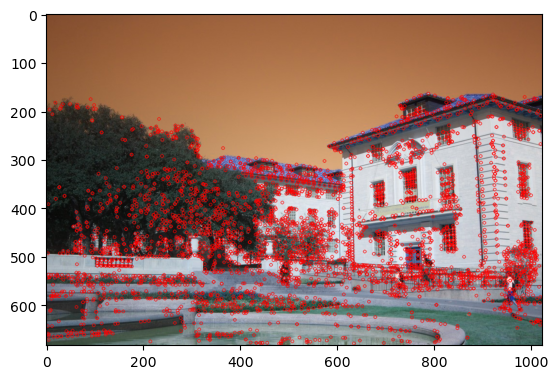

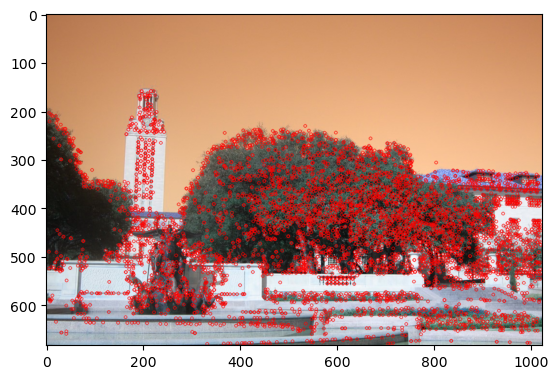

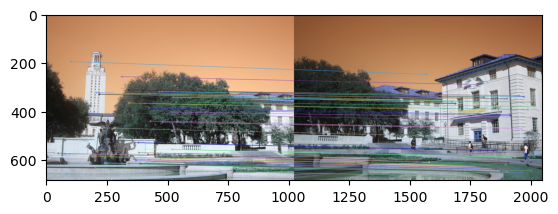

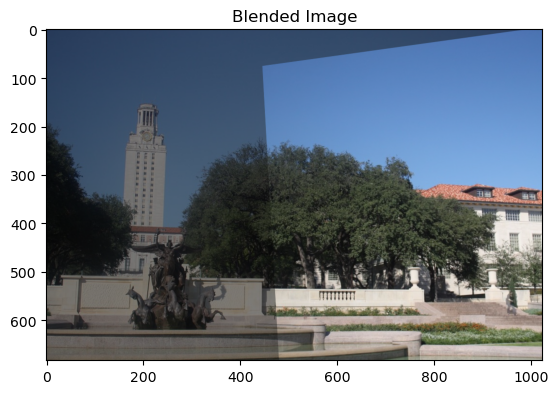

In [18]:
# E. Imgage Stiching
img1 = cv2.imread('./images/foto1A.jpg')         
img2 = cv2.imread('./images/foto1B.jpg') 
keypoints1,descriptors1 = extract_descriptors(img1)
keypoints2,descriptors2 = extract_descriptors(img2)
matches = match_features(descriptors1,img2,keypoints1,descriptors2,img1,keypoints2)
M,mask = estimate_homography(keypoints1,keypoints2,matches)

# Warp the first image using the homography
result = cv2.warpPerspective(img1, M, (img2.shape[1], img2.shape[0]))

# Blending the warped image with the second image using alpha blending
alpha = 0.5  # blending factor
blended_image = cv2.addWeighted(result, alpha, img2, 1 - alpha, 0)

# Display the blended image
show(blended_image,'Blended Image')

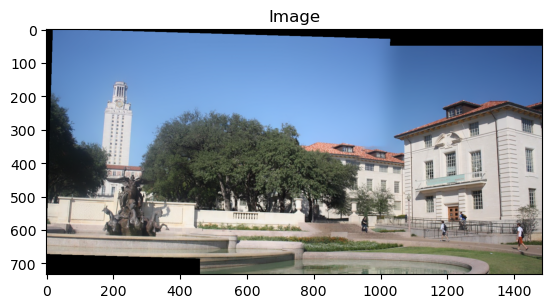

In [19]:
stitcher = cv2.Stitcher.create(cv2.Stitcher_SCANS)
status, pano = stitcher.stitch([img1,img2])
if status == cv2.Stitcher_OK:    
    show(pano)

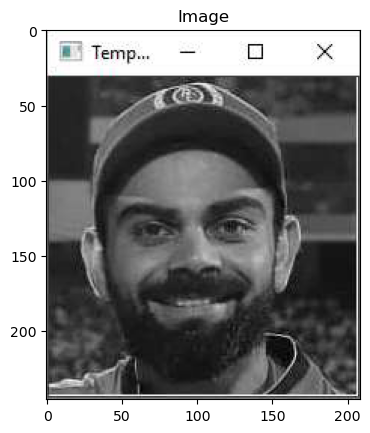

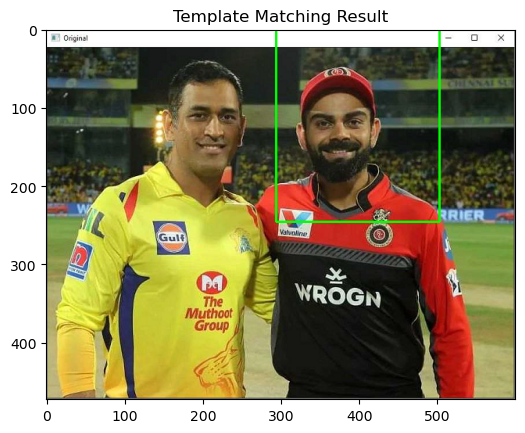

In [20]:
#F. Template Mathing
show(cv2.imread('./images/templates.png'))
template_image, match_coordinates = template_matching('./images/templates.png','./images/image_matching.png')
show(template_image,"Template Matching Result")

In [21]:
# G. Simple Feature Based Tracking
def feature_tracking(video_path):
  # Read video
  cap = cv2.VideoCapture(video_path)
    
  # Get video metadata
  video_fps = cap.get(cv2.CAP_PROP_FPS),
  height = cap.get(cv2.CAP_PROP_FRAME_HEIGHT)
  width = cap.get(cv2.CAP_PROP_FRAME_WIDTH)
  fourcc = cv2.VideoWriter_fourcc(*"MJPG")
  out = cv2.VideoWriter('./images/output.avi',  fourcc=fourcc,
                     fps=video_fps[0], frameSize=(int(width), int(height)), isColor=True)
  
  sift = cv2.SIFT_create()
  bf = cv2.BFMatcher()
  ret, old_frame = cap.read()
  kp1, des1 = sift.detectAndCompute(old_frame,None)
  # Track features in subsequent frames
  while True:
    ret, frame = cap.read()
    if not ret:
      break
    kp2, des2 = sift.detectAndCompute(frame,None)
    # Match descriptors.
    matches = bf.match(des1,des2)
    # Sort them in the order of their distance.
    kp = []
    for match in sorted(matches, key = lambda x:x.distance)[:50]:
        kp.append(kp2[match.trainIdx])
    cv2.drawKeypoints(frame,kp,frame, color=(255,0,0), flags=cv2.DRAW_MATCHES_FLAGS_NOT_DRAW_SINGLE_POINTS )
    out.write(frame)
  cap.release()
  out.release()
  cv2.destroyAllWindows()
  return out
out=feature_tracking("./images/test_video.mp4")
Video("./images/output.avi") 

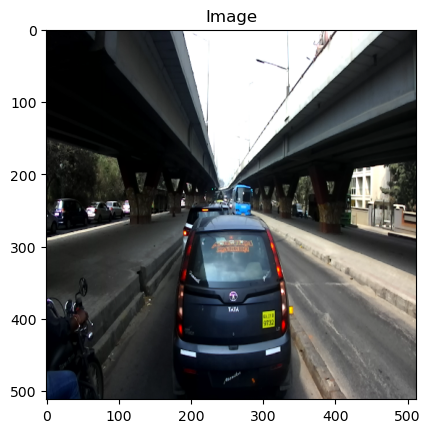

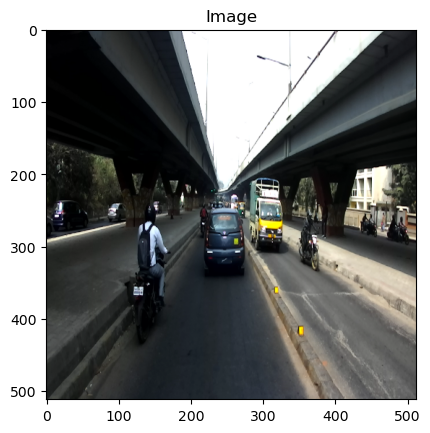

In [22]:
# Excercise : Perform Feature Detection and Matching and homography
img1 = cv2.imread('./images/Image_6859.png')         
img2 = cv2.imread('./images/Image_6860.png') 
show(img1)
show(img2)
